# Анализ рынка заведений общественного питания Москвы

Инвесторы фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве.

Цель: подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

План работы:
- описание данных
- загрузка библиотек
- предобработка данных
- анализ данных
- детализация исследования
- подготовка презентации
- общий вывод

## Описание данных

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
Проект выполнен для стартапа, который продаёт продукты питания. 

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    «Средний счёт: 1000–1500 ₽»;
    «Цена чашки капучино: 130–220 ₽»;
    «Цена бокала пива: 400–600 ₽».
    и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    0 — заведение не является сетевым
    1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Загрузка библиотек

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import seaborn as sns
from plotly import graph_objects as go

import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

import warnings 
warnings.filterwarnings('ignore')

## Предобработка данных

Прочитаем csv файл

Выгрузим первые строки датасетов и информацию о них для первичной проверки качества данных.

In [3]:
pd.set_option('max_colwidth', None)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Переведем значения в колонках в нижний регистр для исключения ошибок при вводе

In [5]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data['avg_bill'] = data['avg_bill'].str.lower()

Проверим количество уникальных заведений

In [6]:
data['name'].nunique()

5512

Проверим наличие дубликатов в данных

In [7]:
data.duplicated().sum()

0

Явных дубликатов не выявлено

Проверим неявные дубликаты и удалим их

In [8]:
data.duplicated(subset = ['name', 'address']).sum()

4

Удалим неявные дубликаты

In [9]:
data = data.drop_duplicates(subset = ['name', 'address'])

In [10]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Значительное число пропусков в столбцах:
- hours,
- price,
- avg_bill, 
- middle_avg_bill,
- middle_coffee_cup, 
- seats

Следует изучить данные, чтобы заполнить пропуски корректно.

Создадим столбец street

In [11]:
data['street'] = data['address'].str.split(',').str[1]

Создадим столбец is_24/7, с указанием, работает ли заведение круглосуточно
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — если не работает ежедневно и круглосуточно.

In [12]:
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'

Данные предварительно готовы для анализа.

## Анализ данных

### Категории заведений общественного питания

In [13]:
category_name = data.groupby('category')['name'].count().reset_index()
category_name.columns = ['category', 'count']
category_name

,category,count
0,"бар,паб",764
1,булочная,256
2,быстрое питание,603
3,кафе,2376
4,кофейня,1413
5,пиццерия,633
6,ресторан,2042
7,столовая,315


In [14]:
fig = px.bar(category_name,
             x='category',
             y='count',
             text = 'count',
             title = 'Количество заведений общественного питания по категориям'
             )
fig.update_layout(xaxis_title = 'Категории заведений',
                  yaxis_title = 'Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод:** Наиболее распространенной категорией заведений является кафе - 2376, наименьшее количество булочных - 256. 

### Количество мест в заведениях общественного питания

Изучим распределение количества мест в заведениях, определим выбросы.

In [15]:
data['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

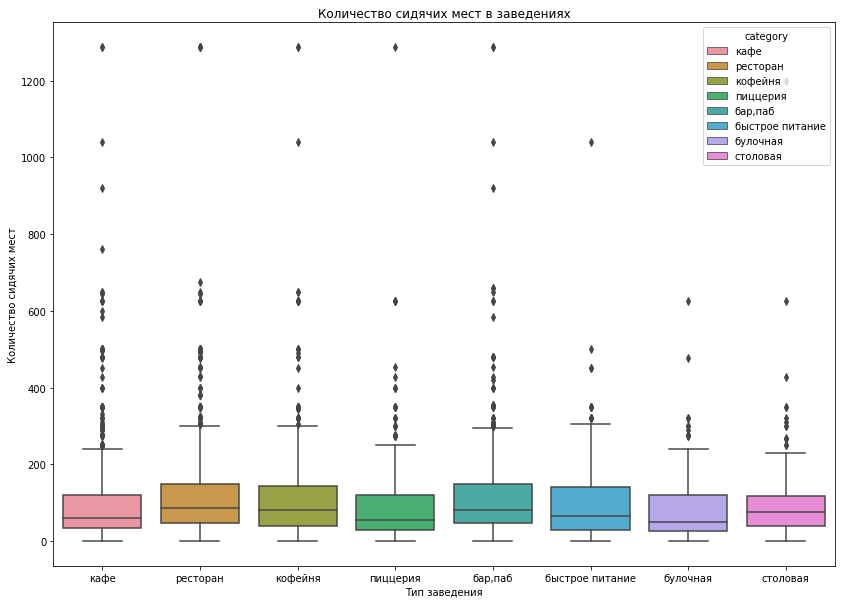

In [16]:
plt.figure(figsize=(14, 10))
sns.set_palette('rocket')
sns.boxplot(y='seats', x='category', data=data, hue="category", dodge=False)
#sns.set(rc={'figure.figsize':(14,14)})
plt.title('Количество сидячих мест в заведениях')
plt.xlabel('Тип заведения')
plt.ylabel('Количество сидячих мест')
plt.show()

In [17]:
print('Количество заведений с числом мест больше 500:', data[data['seats'] > 500]['name'].count())

Количество заведений с числом мест больше 500: 56


Заведений с числом мест более 500 - 56, что составляет менее 1%. Отбросим эти значения.

In [18]:
data_500 = data[data['seats'] > 500]
data = data.query('index not in @data_500.index')
print('Заведений с числом мест больше 500:', data[data['seats'] > 500]['name'].count())

Заведений с числом мест больше 500: 0


**Вывод:** На графике есть выбросы. Скорее всего они связаны с ошибками при заполнении данных. Установим допустимую границу в 500 мест, остальное отсекаем. Преимущественно количество мест в заведениях всех типов находится в границах от 40 до 140 мест.

### Соотношение сетевых и несетевых заведений

Согласно описанию данных, chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки): 0 — заведение не является сетевым 1 — заведение является сетевым. Подсчитаем количество заведений по этому признаку, предварительно заменив названия в столбцах.

In [19]:
data['chain'] = data['chain'].replace(0, 'несетевые')
data['chain'] = data['chain'].replace(1, 'сетевые')

In [20]:
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,несетевые,5169
1,сетевые,3177


In [21]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.update_layout(legend_orientation="h")
fig.show()

**Вывод:** По графику видно, что почти 62% заведений в Москве - несетевые.

### Какие категории заведений чаще являются сетевыми

In [22]:
chain_category = data.query('chain == "сетевые"').pivot_table(index = 'category', values = 'name', 
                                                              aggfunc = 'count').sort_values(by = 'name', ascending = False)
chain_category_merge = category_name.merge(chain_category, how='left', on='category').reset_index()
chain_category_merge['percent'] = round(chain_category_merge['name']/chain_category_merge['count']*100, 1)
chain_category_merge

,index,category,count,name,percent
0,0,"бар,паб",764,167,21.9
1,1,булочная,256,156,60.9
2,2,быстрое питание,603,231,38.3
3,3,кафе,2376,774,32.6
4,4,кофейня,1413,713,50.5
5,5,пиццерия,633,328,51.8
6,6,ресторан,2042,721,35.3
7,7,столовая,315,87,27.6


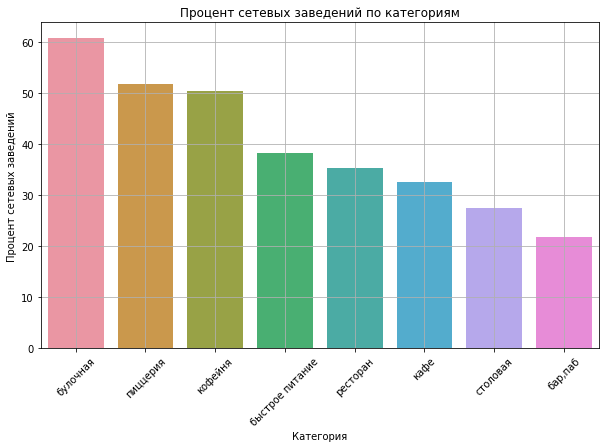

In [23]:
plt.figure(figsize=(10, 6))
sns.barplot(x='category', 
            y='percent', 
            data=chain_category_merge.sort_values(by = 'percent', ascending = False))
plt.title('Процент сетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Процент сетевых заведений')
plt.xticks(rotation=45)
plt.grid()
plt.show()

**Вывод:** По графику видно, большинство сетевых заведений представлены в категориях "булочная" и пиццерия". Среди сетевых заведений наименьшая доля приходится на бары и пабы.

### Группировка данных по названиям заведений, топ-15 популярных сетей в Москве

In [24]:
top_chain = data.query('chain == "сетевые"').pivot_table(index = 'name', values = 'chain', 
                            aggfunc = 'count').sort_values(by = 'chain', ascending = False).reset_index().head(15)
fig = px.bar(top_chain, x='name', y='chain', title='Топ-15 сетевых заведений')
fig.update_layout(xaxis_title='Название заведения',
                  yaxis_title='Количество заведений в сети')
fig.update_xaxes(tickangle=90)
fig.show()

**Вывод:** Топ-15 сетевых заведений представлены следующими брендами: Шоколадница, Доминоc пицца, Додо пицца, One price coffee, яндекс лавка, cofix, prime, Хинкальная, Кофепорт, Теремок, Кулинарная лавка братьев Караваевых, Чайхана, Cofefest, буханка, му-му. 1 место занимает Шоколадница - 118 заведений. 2 и 3 место близки по значению, Доминос пицца - 76 и Додо пицца - 74. Замыкает топ-15 Му-му с 27 заведениями.

### Общее количество заведений и количество заведений каждой категории по районам Москве

Изучим общее распределение количества заведений по районам Москвы

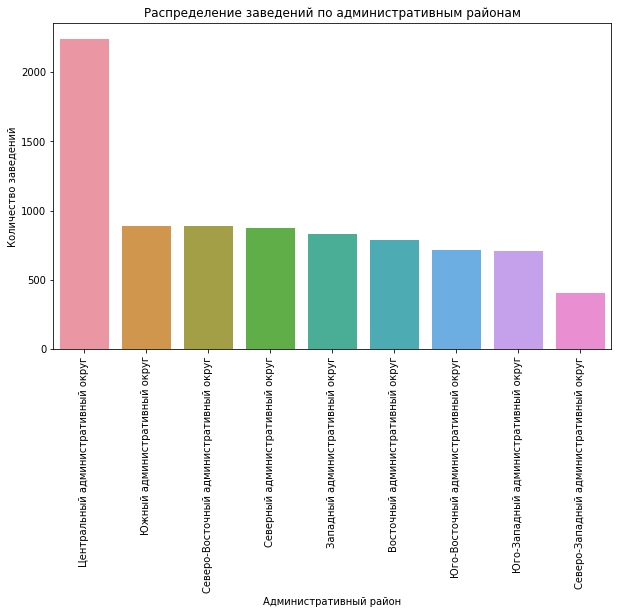

In [25]:
district = data.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', 
                                                                                              ascending = False).reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(x = 'district', y = 'name', data = district)
plt.title('Распределение заведений по административным районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

Разделим по категориям:

In [26]:
district_per_category = data.groupby(['district', 'category']).agg(count=('category', 'count')).reset_index()
fig = px.bar(district_per_category.sort_values(by='count', ascending=False), 
             x='district', 
             y='count', 
             color='category')
fig.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis_title='Район',
                  yaxis_title='Количество заведений',
                  height=800,
                  width=1000,
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод:** Больше всего заведений общественного питания находится в Центральном административном округе (более 2000). В 2-3 раза меньше заведений в других округах. Меньше всего заведений в Северо-Западном округе (менее 500).
В Центральном администативном округе большую часть заведений составляют рестораны, кафе, кофейни и бары. В других округах большую часть заведений составляют кафе.

Визуализируем средний рейтинг по категориям заведений.

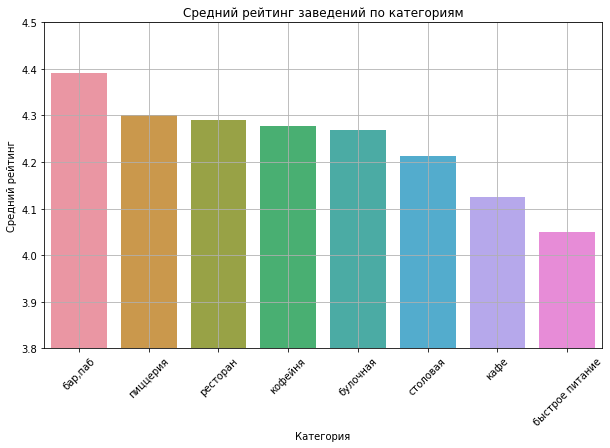

In [27]:
ratings = data.groupby('category').agg(mean_rating=('rating', 'mean')).sort_values(by='mean_rating',
                                                                                 ascending=False).reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='mean_rating', data=ratings) 
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45)
plt.ylim(3.8, 4.5)
plt.grid()
plt.show()

**Вывод:** Самый высокий средний рейтинг - у заведений категории "бар, паб"(около 4.4). На втором месте пиццерии(4.3). На третьем месте рестораны(чуть ниже 4.3). Худший рейтинг у заведений быстрого питания(около 4.05).

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

Аггрегируем данные рейтингов по районам

In [28]:
distr_ratings = data.groupby('district').agg(mean_rating=('rating', 'mean')).sort_values(by='mean_rating',
                                                                                       ascending=False).reset_index()

Построим картограмму 

In [29]:
# загружаем JSON-файл с границами округов Москвы
try:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
except:
    state_geo = '/datasets/admin_level_geomap.geojson'
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=distr_ratings,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самый высокий средний рейтинг - у заведений Центрального административного округа (около 4.38). Самые низкие средние рейтинги - у заведений Северо-Восточного и Юго-Восточного административных округов (4.1). У заведений остальных округов средний рейтинг составил 4.24.

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [30]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

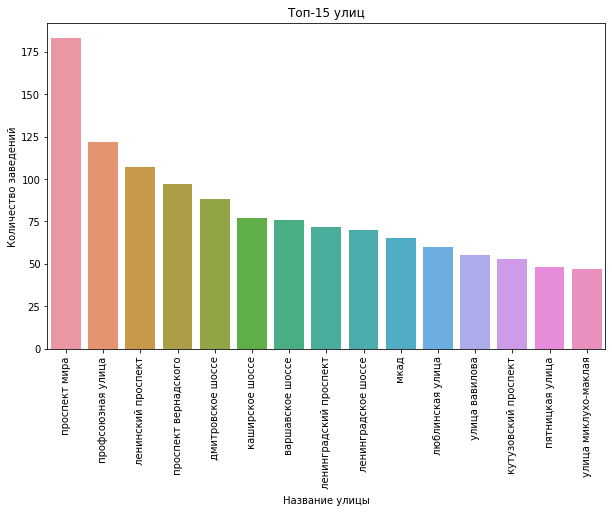

In [31]:
top_street = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by = 'name', 
                                                                                ascending = False).reset_index().head(15)
plt.figure(figsize=(10, 6))
sns.barplot(x = 'street', y = 'name', data = top_street)
plt.title('Топ-15 улиц')
plt.xlabel('Название улицы')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

In [32]:
street = top_street['street']
#теперь можно делить на категории
street_per_category = data.query("street in @street").groupby(['street', 'category']).agg(count=('category', 'count')).reset_index()
fig = px.bar(street_per_category.sort_values(by='count', ascending=False), 
             x='street', 
             y='count', 
             color='category')
fig.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis_title='Район',
                  yaxis_title='Количество заведений',
                  height=800,
                  width=1000,
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод:** Больше всего заведений находится на проспекте Мира. Из них большую часть составляют кафе и рестораны, на третьем месте кофейни. Большую часть заведений на популярных улицах составляют кафе и рестораны примерно в равных долях. На МКАД наибольшая доля кафе.

### Улицы, на которых находится только один объект общепита

In [33]:
street_one_place = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').query("name == 1").reset_index()
only_one_street = street_one_place['street']
data_only_one_street = data.query("street in @only_one_street")
data_only_one_street

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,средний счёт:300–500 ₽,400.0,NaN,несетевые,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,средний счёт:500–800 ₽,650.0,NaN,сетевые,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сетевые,NaN,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"москва, улица шкулёва, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,несетевые,90.0,улица шкулёва,False
8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,несетевые,NaN,улица артюхиной,False
8317,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,сетевые,NaN,кузьминская улица,False
8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,сетевые,40.0,новороссийская улица,False


Заведений, что являются единственными на улицу, всего 457. Рассмотрим, к каким категориям они относятся.

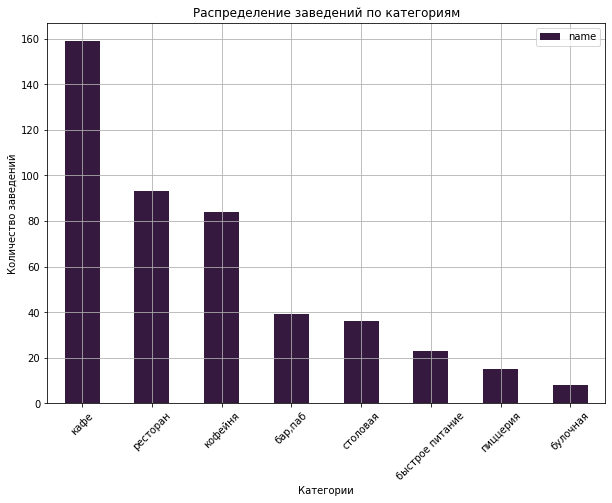

In [34]:
data_only_one_street.pivot_table(index = 'category', values = 'name', aggfunc = 'count').sort_values(by = 'name', 
                                                                    ascending = False).plot(kind = 'bar', figsize=(10, 7))
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категории')
plt.xticks(rotation = 45)
plt.grid()
plt.show()

Наибольшая доля приходится на кафе, наименьшая на булочные. Оценим распределение по районам.

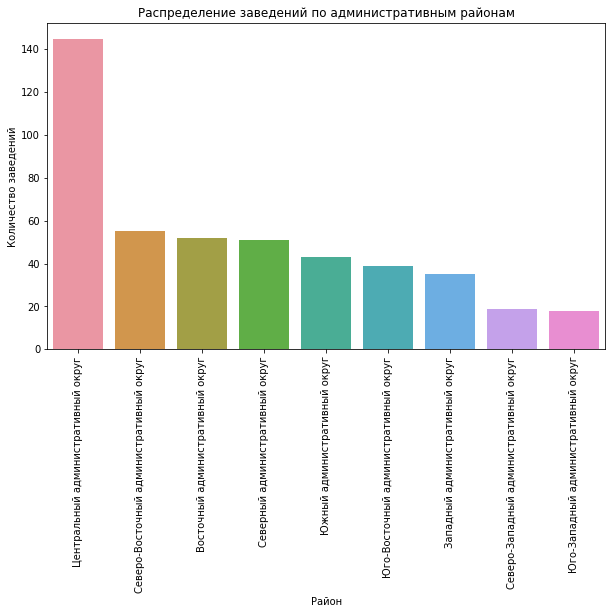

In [35]:
district_only_one = data_only_one_street.pivot_table(index = 'district', values = 'name', 
                                    aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(x = 'district', y = 'name', data = district_only_one)
plt.title('Распределение заведений по административным районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

Больше всего таких заведений в Центральном административном округе, меньше всего в Юго-Западном. Узнаем, сколько из них "сетевых" и "несетевых" заведений.

In [36]:
chain_only_one = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count').sort_values(by = 'name', 
                                          ascending = False).reset_index()
chain_only_one.columns = ['chain', 'count']
fig = go.Figure(data=[go.Pie(labels=chain_only_one['chain'], values=chain_only_one['count'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений')
fig.update_layout(legend_orientation="h")
fig.show()

Доля сетевых 38.1%, несетевых 61.9%.

**Вывод:** Заведений, что являются единственными на улицу, всего 457. Наибольшая доля приходится на кафе, наименьшая на булочные. Больше всего таких заведений в Центральном административном округе, меньше всего в Юго-Западном. Среди них доля сетевых 38.1%, несетевых 61.9%.

###  Медиана middle_avg_bill для каждого района. 
Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Определим, как удалённость от центра влияет на цены в заведениях

In [37]:
median_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [38]:
# создаем карту Москвы

mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = median_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Средний чек заведений по районам',
).add_to(mm)

mm

**Вывод:** Самые высокие средние чеки - в заведениях общественного питания Центрального и Западного административных округов (1000 руб.), самый низкий - в Юго-Восточном административном округе (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Можно сделать вывод, что удалённость от центра влияет на величину среднего чека не во всех округах Москвы.

###  Вывод:
- Наиболее распространенной категорией заведений является кафе - 2376, наименьшее количество булочных - 256.
- Преимущественно количество мест в заведениях всех типов находится в границах от 40 до 140 мест.
- 62% заведений в Москве - несетевые, 38% - сетевые.
- большинство сетевых заведений представлены в категориях "булочная" и пиццерия". Среди сетевых заведений наименьшая доля приходится на бары и пабы.
- Топ-15 сетевых заведений представлены следующими брендами: Шоколадница, Доминоc пицца, Додо пицца, One price coffee, яндекс лавка, cofix, prime, Хинкальная, Кофепорт, Теремок, Кулинарная лавка братьев Караваевых, Чайхана, Cofefest, буханка, му-му. 1 место занимает Шоколадница - 118 заведений. 2 и 3 место близки по значению, Доминос пицца - 76 и Додо пицца - 74. Замыкает топ-15 Му-му с 27 заведениями.
- Больше всего заведений общественного питания находится в Центральном административном округе (более 2000). В 2-3 раза меньше заведений в других округах. Меньше всего заведений в Северо-Западном округе (менее 500). В Центральном администативном округе большую часть заведений составляют рестораны, кафе, кофейни и бары. В других округах большую часть заведений составляют кафе.
- Самый высокий средний рейтинг - у заведений категории "бар, паб"(около 4.4). На втором месте пиццерии(4.3). На третьем месте рестораны(чуть ниже 4.3). Худший рейтинг у заведений быстрого питания(около 4.05).
- Самый высокий средний рейтинг - у заведений Центрального административного округа (около 4.38). Самые низкие средние рейтинги у заведений Северо-Восточного и Юго-Восточного административных округов (4.1). У заведений остальных округов средний рейтинг составил 4.24
- Больше всего заведений находится на проспекте Мира. Из них большую часть составляют кафе и рестораны, на третьем месте кофейни. Большую часть заведений на популярных улицах составляют кафе и рестораны примерно в равных долях. На МКАД наибольшая доля кафе.
- Заведений, что являются единственными на улицу, всего 457. Наибольшая доля приходится на кафе, наименьшая на булочные. Больше всего таких заведений в Центральном административном округе, меньше всего в Юго-Западном. Среди них доля сетевых 38.1%, несетевых 61.9%.
- Самые высокие средние чеки - в заведениях общественного питания Центрально и Западного административных округов (1000 руб.), самый низкий - в Юго-Восточном административном округе (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Можно сделать вывод, что удалённость от центра влияет на величину среднего чека не во всех округах Москвы.

## Детализация данных

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Изучим ряд вопросов и дадим рекомендации.

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [39]:
data_coffee = data.query("category == 'кофейня'")
data_coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевые,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевые,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевые,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевые,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,люблинская улица,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,цена чашки капучино:100–220 ₽,NaN,160.0,несетевые,206.0,волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,несетевые,NaN,грайвороновская улица,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,цена чашки капучино:80–120 ₽,NaN,100.0,несетевые,NaN,новохохловская улица,False


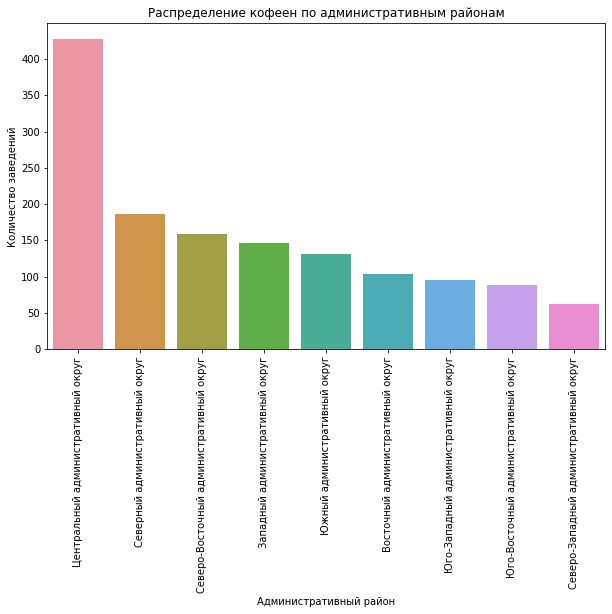

In [40]:
district = data_coffee.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by = 'name', 
                                                                                        ascending = False).reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(x = 'district', y = 'name', data = district)
plt.title('Распределение кофеен по административным районам')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = 90)
plt.show()

In [41]:
# создаём карту Москвы
mс = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(mс)

# выводим карту
mс

**Вывод:** В датасете 1401 кофейня. Наибольшая доля их расположена в Центральном административном районе (428). От 120 до 180 кофеен - в Северном, Северо-Восточном и Западном округах. В остальных районах от 50 до 110 кофеен.  

### Есть ли круглосуточные кофейни?

In [42]:
data_coffee['is_24_7'] = data_coffee['is_24_7'].replace(True, 'круглосуточные 24/7')
data_coffee['is_24_7'] = data_coffee['is_24_7'].replace(False, 'некруглосуточные')
is_24_7 = data_coffee.pivot_table(index = 'is_24_7', values = 'name', aggfunc = 'count').sort_values(by = 'name', 
                                                                                            ascending = False).reset_index()
is_24_7.columns = ['is_24_7', 'count']
fig = go.Figure(data=[go.Pie(labels=is_24_7['is_24_7'], values=is_24_7['count'])])
fig.update_layout(title='Соотношение круглосуточных и некруглосуточных заведений')
fig.update_layout(legend_orientation="h")
fig.show()

95,8% кофеен некруглосуточные, лишь 4,21% кофеен работают круглосуточно.

### Какие у кофеен рейтинги? Как они распределяются по районам?

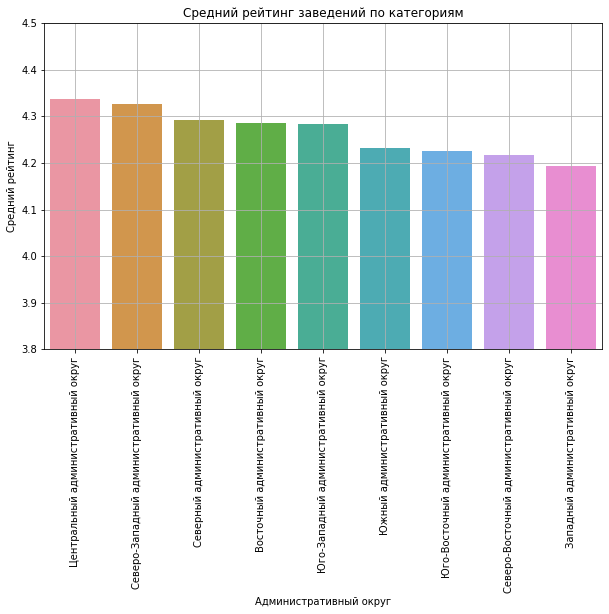

In [43]:
coffee_district_rating = data_coffee.groupby('district').agg(mean_rating=('rating', 'mean')).sort_values(by='mean_rating', 
                                                                                        ascending=False).reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(x='district', y='mean_rating', data=coffee_district_rating) 
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Административный округ')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=90)
plt.ylim(3.8, 4.5)
plt.grid()
plt.show()

Самый высокий средний рейтинг в Центральном административном округе и Северо-Западном административном округе(выше 4.3). Самый низкий средний рейтинг в Западном административном округе (ниже 4.2).

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

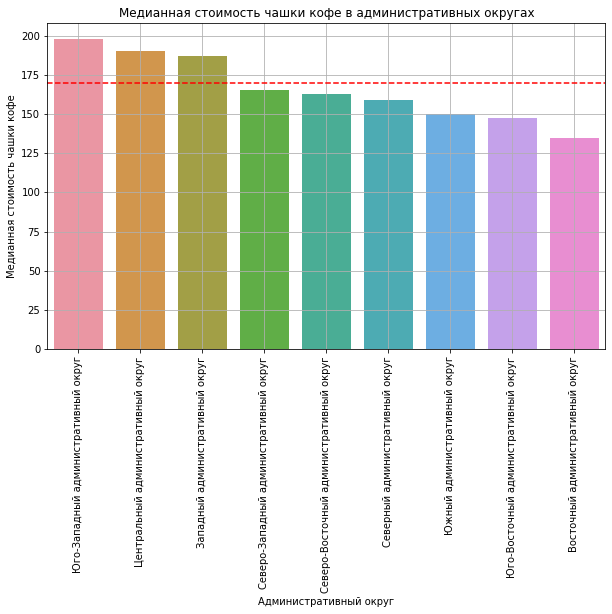

In [51]:
plt.figure(figsize=(10, 6))
middle_coffee_cup = data_coffee.pivot_table(index = 'district', values = 'middle_coffee_cup', 
                    aggfunc = 'median').sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()

#plt.axhline(y=middle_coffee_cup, color='red', linestyle='--') 

sns.barplot(x='district', y='middle_coffee_cup', data=middle_coffee_cup) 


plt.title('Медианная стоимость чашки кофе в административных округах')
plt.xlabel('Административный округ')
plt.ylabel('Медианная стоимость чашки кофе')
plt.axhline (y=data_coffee['middle_coffee_cup'].median(), color='red', linestyle='--')
plt.xticks(rotation=90)

plt.grid()
plt.show()

Средняя цена чашки кофе по Москве:

In [45]:
middle_coffee_cup_mean = middle_coffee_cup.mean()
middle_coffee_cup_mean

middle_coffee_cup    166.0
dtype: float64

Самая высокая стоимость в Юго-Западном, Центральном и Западном административных округах(175-200 руб). Самая низкая стоимость в Восточном административном округе(125-150 рублей).

**Вывод:** На основании полученных данных рекомендуется открывать кофейню в Юго-Западном административном округе. Причины:  низкое количество заведений и самые дорогие медианные цены на чашку кофе. Если открыть кофейню и установить более низкие, конкурентные цены на чашку кофе, при условии хорошего качества кофе, сервиса, расположения и достаточной рекламы, заведение должно пользоваться успехом. Лучше всего открывать кофейню возле мест высокой проходимости, например, метро, торговых центров, учебных заведений, офисных зданий. Также стоит рассмотреть вариант открытия круглосуточной кофейни - таких вариантов на рынке очень мало.

## Подготовка презентации

Выберем важные тезисы и наблюдения, которые могут заинтересовать заказчиков и подготовим презентацию. 

<a href="https://drive.google.com/file/d/14K_vdgUO6V0PW9Spgzt9ITLRsvrTwH1k/view?usp=drive_link">Презентация</a>

## Общий вывод

Инвесторы фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве.

Цель: подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. 

Выполнена предварительная обработка данных. Удалены дубликаты явные и неявные. Добавлены столбцы для анализа по отдельным улицам и для определения заведений с круглосуточным режимом работы.

Выполнен анализ данных и получены следующие наблюдения:
- Наиболее распространенной категорией заведений является кафе - 2376, наименьшее количество булочных - 256.
- Преимущественно количество мест в заведениях всех типов находится в границах от 40 до 140 мест.
- 62% заведений в Москве - несетевые, 38% - сетевые.
- большинство сетевых заведений представлены в категориях "булочная" и пиццерия". Среди сетевых заведений наименьшая доля приходится на бары и пабы.
- Топ-15 сетевых заведений представлены следующими брендами: Шоколадница, Доминоc пицца, Додо пицца, One price coffee, яндекс лавка, cofix, prime, Хинкальная, Кофепорт, Теремок, Кулинарная лавка братьев Караваевых, Чайхана, Cofefest, буханка, му-му. 1 место занимает Шоколадница - 118 заведений. 2 и 3 место близки по значению, Доминос пицца - 76 и Додо пицца - 74. Замыкает топ-15 Му-му с 27 заведениями.
- Больше всего заведений общественного питания находится в Центральном административном округе (более 2000). В 2-3 раза меньше заведений в других округах. Меньше всего заведений в Северо-Западном округе (менее 500). В Центральном администативном округе большую часть заведений составляют рестораны, кафе, кофейни и бары. В других округах большую часть заведений составляют кафе.
- Самый высокий средний рейтинг - у заведений категории "бар, паб"(около 4.4). На втором месте пиццерии(4.3). На третьем месте рестораны(чуть ниже 4.3). Худший рейтинг у заведений быстрого питания(около 4.05).
- Самый высокий средний рейтинг - у заведений Центрального административного округа (около 4.38). Самые низкие средние рейтинги у заведений Северо-Восточного и Юго-Восточного административных округов (4.1). У заведений остальных округов средний рейтинг составил 4.24
- Больше всего заведений находится на проспекте Мира. Из них большую часть составляют кафе и рестораны, на третьем месте кофейни. Большую часть заведений на популярных улицах составляют кафе и рестораны примерно в равных долях. На МКАД наибольшая доля кафе.
- Заведений, что являются единственными на улицу, всего 457. Наибольшая доля приходится на кафе, наименьшая на булочные. Больше всего таких заведений в Центральном административном округе, меньше всего в Юго-Западном. Среди них доля сетевых 38.1%, несетевых 61.9%.
- Самые высокие средние чеки - в заведениях общественного питания Центрально и Западного административных округов (1000 руб.), самый низкий - в Юго-Восточном административном округе (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Можно сделать вывод, что удалённость от центра влияет на величину среднего чека не во всех округах Москвы.

Так как инвесторы хотели бы рассмотреть вариант открытия кофейни, проведен обзор рынка общепита в этом сегменте. Получены следующие выводы:
- В датасете 1401 кофейня. Наибольшая доля их расположена в Центральном административном районе (428). От 120 до 180 кофеен - в Северном, Северо-Восточном и Западном округах. В остальных районах от 50 до 110 кофеен.
- 95,8% кофеен некруглосуточные, лишь 4,21% кофеен работают круглосуточно.
- Самый высокий средний рейтинг в Центральном административном округе и Северо-Западном административном округе(выше 4.3). Самый низкий средний рейтинг в Западном административном округе (ниже 4.2).
- Самая высокая стоимость в Юго-Западном, Центральном и Западном административных округах(175-200 руб). Самая низкая стоимость в Восточном административном округе(125-150 рублей).

На основании полученных данных рекомендуется открывать кофейню в Юго-Западном административном округе. Причины:  низкое количество заведений и самые дорогие медианные цены на чашку кофе. Если открыть кофейню и установить более низкие, конкурентные цены на чашку кофе, при условии хорошего качества кофе, сервиса, расположения и достаточной рекламы, заведение должно пользоваться успехом. Лучше всего открывать кофейню возле мест высокой проходимости, например, метро, торговых центров, учебных заведений, офисных зданий. Также стоит рассмотреть вариант открытия круглосуточной кофейни - таких вариантов на рынке очень мало.

Данные выполненного анализа сведены в презентацию, прикрепленную в отчете в формате pdf.